# **Text extraction demo using Llama3.2-Vision**

In [4]:
from PIL import Image
from IPython.display import display
import ollama


# Load the image
image_path = "Photos/Surrendered BL SSL21169.jpg"
image = Image.open(image_path)



### The scanned document from which the text is extracted

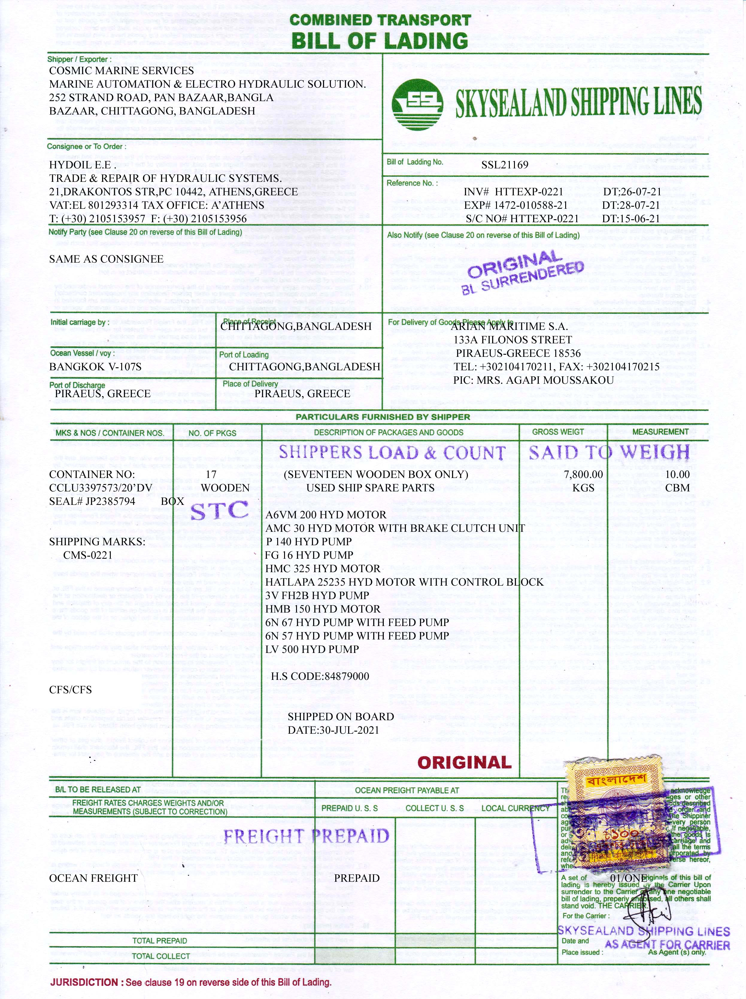

In [40]:
display(image)

## Using llama to extract the text, by taking into consideration the layout of the document

### Llama3.2-vision:90b

In [ ]:
prompt = """This is a scanned bill of lading document which contains text and also tables that contain useful information
Extract the text contained in the scanned document by taking into consideration the layout of the document.
Your output should be the extracted text."""

response = ollama.chat(
    model='llama3.2-vision:90b',
    messages=[{
        'role': 'user',
        'content': prompt,
        'images': ['Photos/Surrendered BL SSL21169.jpg']
    }]
)

print(response.message.content)

The following is a detailed breakdown of the information presented in the scanned bill of lading document:

**Shipper/Exporter**
- COSMIC MARINE SERVICES
- MARINE AUTOMATION & ELECTRO HYDRAULIC SOLUTION.

**Consignee or To Order**
- HYDOIL E.E.
- TRADE & REPAIR OF HYDRAULIC SYSTEMS.

**Bill of Lading No.**
- SSL21169

**Reference No.**
- INV# HTTEXP-0221
- EXP# 1472-010588-21
- S/C NO# HTTEXP-0221

**Notify Party**
- SAME AS CONSIGNEE

**Initial Carriage By**
- Ocean Vessel / voy: BANGKOK V-107S
- Port of Loading: CHITTAGONG, BANGLADESH
- Place of Delivery: PIRAEUS, GREECE

**Particulars Furnished by Shipper**

| MKS & NOS / CONTAINER NOS | NO. OF PKGS | DESCRIPTION OF PACKAGES AND GOODS | GROSS WEIGHT |
| --- | --- | --- | --- |
| 17 WOODEN BOXES | 17 | USED SHIP SPARE PARTS | 7,800.00 KGS |

**Measurement**
- 10.00 CBM

**Shipping Marks**
- CMS-0221

**CFS/CFS**
- H.S CODE: 84879000

**Shipped on Board Date**
- July 30, 2021

### Llama3.2-vision:11b

In [ ]:
response = ollama.chat(
    model='llama3.2-vision',
    messages=[{
        'role': 'user',
        'content': prompt,
        'images': ['Photos/Surrendered BL SSL21169.jpg']
    }]
)

print(response.message.content)

The extracted text from the scanned Bill of Lading document is:

**Header**

* Shipper/Exporter: COSMIC MARINE SERVICES
* Consignee: HYDOIL E.E.
* Trade and Repair of Hydraulic Systems
* 21, Drakontos Str., PC 10442, Athens, Greece

**Shipment Details**

* Vessel: BANGKOK V-107S
* Port of Loading: CHITTAGONG, BANGLADESH
* Port of Discharge: PIRAEUS, GREECE
* Place of Delivery: PIRAEUS, GREECE

**Container Information**

* Container No.: CCLU3397573/20'DV
* Seal No.: JP2385794
* Quantity: 17 WOODEN BOXES

**Shippers Load & Count**

| **Description of Packages and Goods** | **Gross Weight (KGS)** |
| --- | --- |
| SEVENTEEN WOODEN BOX ONLY USED SHIP SPARE PARTS | 7,800.00 |

**Freight Prepaid**

* Freight charges prepaid by the shipper

**Ocean Freight**

* Ocean freight prepaid by the shipper

**Bill of Lading No.**

* SSL21169

**Skysealand Shipping Lines**

* Agent for Carrier: SKYSEALAND SHIPPING LINES
* Date and Place Issued: 30 JUL-2021

Note: The text has been extracted from the scanned document, taking into consideration the layout and formatting of the original document.

------------------------------------------------------

# **Results**
+ The higher parameter model achieves better extraction (better understanding of the layout, more details). 
+ Both models fail to fetch the list of goods contained in the document 

**However**, if we specifically ask about the list of goods we can see that they are actually recognized. If we decide to use this model for text extraction we will be able to avoid the problem mentioned above by parsing the scanned document in smaller pieces.
The extraction of the list of goods can be seen bellow: 


In [16]:
prompt = """Tell me exactly what good s are described in this bill of lading. Make a list."""

response = ollama.chat(
    model='llama3.2-vision',
    messages=[{
        'role': 'user',
        'content': prompt,
        'images': ['Photos/Surrendered BL SSL21169.jpg']
    }]
)

print(response['message']['content'])

This Bill of Lading lists the following goods:

* **Seventeen wooden boxes**: These are used to ship spare parts.
* **A6VM 200 HYD MOTOR**
* **AMC 30 HYD MOTOR WITH BRAKE CLUTCH UNIT**
* **P140 HYD PUMP**
* **FG16 HYD PUMP**
* **HMC 325 HYD MOTOR**
* **HATLAPA 25235 HYD MOTOR WITH CONTROL BLOCK**
* **3V FH2B HYD PUMP**
* **HMB 150 HYD MOTOR**
* **6N67 HYD PUMP WITH FEED PUMP**
* **6N57 HYD PUMP WITH FEED PUMP**
* **LV500 HYD PUMP**

These items are described as "USED SHIP SPARE PARTS" in the Bill of Lading.
